In [86]:
import torch.nn
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset,DataLoader

device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
from fastai.data.external import untar_data, URLs
coco_path=untar_data(URLs.COCO_SAMPLE)

In [87]:
import glob
paths=glob.glob(str(coco_path)+'/train_sample/*.jpg')

p=str(coco_path)+'/train_sample*.jpg'


In [88]:
import numpy as np
np.random.seed(1)#언제나 데이터를 똑같이 나누기 위해 난수 설정
chosen_paths=np.random.choice(paths,10000,replace=False)#10000장의 이미지의 경로를 랜덤으로 chosen_path에 저장
index=np.random.permutation(10000)#10000안에서 랜덤으로 인덱스 생성

train_paths=chosen_paths[index[:8000]]#8000번째 즉 8000장 이미지는 훈련용 이미지
val_paths=chosen_paths[index[8000:]]#나머지 2000장이미지는 validation용

print(len(train_paths))
print(len(val_paths))

8000
2000


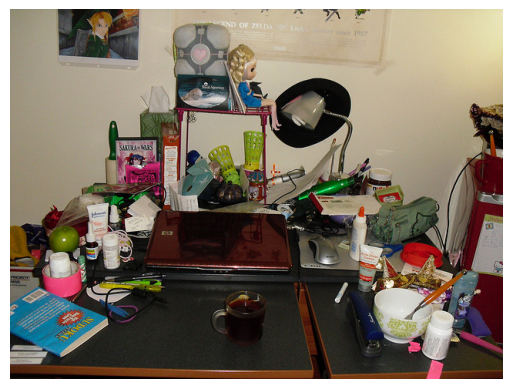

In [89]:
import matplotlib.pyplot as plt
import matplotlib

img=matplotlib.image.imread(train_paths[2])
plt.imshow(img)
plt.axis('off')
plt.show()

In [90]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from skimage.color import rgb2lab, lab2rgb

class ColorizationDataset(Dataset):
  def __init__(self,paths,mode='train'):
    self.paths=paths
    self.mode=mode

    if mode=='train':
      self.transforms=transforms.Compose([
          transforms.Resize((256,256),Image.BICUBIC),
          transforms.RandomHorizontalFlip()#수평반전으로 데이터 증강

      ])
    elif mode=='validation':
      self.transforms=transforms.Resize((256,256),Image.BICUBIC)
    else:
      raise Exception("Train or Validation only!!!")

  def __getitem__(self,index):
    img=Image.open(self.paths[index]).convert("RGB")
    img=np.array(self.transforms(img))
    img=rgb2lab(img).astype("float32")
    img=transforms.ToTensor()(img)

    L=img[[0], ...]/50.-1 #-1부터 1사이로 정규화시킴
    ab=img[[1,2],...]/110. #-1부터 1사이로 정규화

    return {'L':L,'ab':ab}

  def __len__(self):
    return len(self.paths)

In [91]:
dataset_train=ColorizationDataset(train_paths,mode='train')
dataset_val=ColorizationDataset(val_paths,mode='validation')


In [92]:
dataloader_train=DataLoader(dataset_train,batch_size=16,num_workers=2,pin_memory=True)
dataloader_val=DataLoader(dataset_val,batch_size=16,num_workers=2,pin_memory=True)


In [93]:
import torch.nn as nn
class pix2pix_Generator(nn.Module):
  def __init__(self):
    super().__init__()

    self.input_layer=nn.Sequential(
        nn.Conv2d(1,64,kernel_size=4,stride=2,padding=1,bias=False),
    )
    self.encoder_1=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(64,128,kernel_size=4,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(128)
    )
    self.encoder_2=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(128,256,kernel_size=4,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(256)
    )
    self.encoder_3=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(256,512,kernel_size=4,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(512)
    )
    self.encoder_4=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(512,512,kernel_size=4,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(512)
    )
    self.encoder_5=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(512,512,kernel_size=4,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(512)
    )
    self.encoder_6=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(512,512,kernel_size=4,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(512)
    )
    self.middle=nn.Sequential(
        nn.LeakyReLU(0.2,True),
        nn.Conv2d(512,512,kernel_size=4,stride=2,padding=1,bias=True),
        nn.ReLU(True),
        nn.ConvTranspose2d(512,512,kernel_size=4 ,stride=2,padding=1,bias=True),
        nn.BatchNorm2d(512)

    )
    self.decoder_6=nn.Sequential(
        nn.ReLU(True),
        nn.ConvTranspose2d(1024,512,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(512),
        nn.Dropout(0.5)
    )
    self.decoder_5=nn.Sequential(
        nn.ReLU(True),
        nn.ConvTranspose2d(1024,512,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(512),
        nn.Dropout(0.5)
    )
    self.decoder_4=nn.Sequential(
        nn.ReLU(True),
        nn.ConvTranspose2d(1024,512,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(512),
        nn.Dropout(0.5)
    )
    self.decoder_3=nn.Sequential(
        nn.ReLU(True),
       nn.ConvTranspose2d(1024,256,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(256),
        nn.Dropout(0.5)
    )
    self.decoder_2=nn.Sequential(
        nn.ReLU(True),
        nn.ConvTranspose2d(512,128,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(128),
        nn.Dropout(0.5)
    )
    self.decoder_1=nn.Sequential(
        nn.ReLU(True),
        nn.ConvTranspose2d(256,64,kernel_size=4,stride=2,padding=1,bias=False),
        nn.BatchNorm2d(64),
        nn.Dropout(0.5)
    )
    self.output_layer=nn.Sequential(
        nn.ReLU(True),
        nn.ConvTranspose2d(64,2,kernel_size=4,stride=2,padding=1,bias=False),
        nn.Tanh()
    )
  def forward(self,x):
    input_layer=self.input_layer(x)
    encoder_1=self.encoder_1(input_layer)
    encoder_2=self.encoder_2(encoder_1)
    encoder_3=self.encoder_3(encoder_2)
    encoder_4=self.encoder_4(encoder_3)
    encoder_5=self.encoder_5(encoder_4)
    encoder_6=self.encoder_6(encoder_5)

    middle=self.middle(encoder_6)

    cat_6=torch.cat((middle,encoder_6),dim=1)
    decoder_6=self.decoder_6(cat_6)
    cat_5=torch.cat((decoder_6,encoder_5),dim=1)
    decoder_5=self.decoder_5(cat_5)
    cat_4=torch.cat((decoder_5,encoder_4),dim=1)
    decoder_4=self.decoder_4(cat_4)
    cat_3=torch.cat((decoder_4,encoder_3),dim=1)
    decoder_3=self.decoder_3(cat_3)
    cat_2=torch.cat((decoder_3,encoder_2),dim=1)
    decoder_2=self.decoder_2(cat_2)
    cat_1=torch.cat((decoder_2,encoder_1),dim=1)
    decoder_1=self.decoder_1(cat_1)
    x=self.output_layer(decoder_1)

    return x


In [94]:
import torch.nn as nn
import torch

class pix2pix_Discriminator(nn.Module):
  def __init__(self):
      super().__init__()

      self.model=nn.Sequential(
          nn.Conv2d(3,64,kernel_size=4,stride=2,padding=1,bias=False),
          nn.LeakyReLU(0.2,True),

          nn.Conv2d(64,128,kernel_size=4,stride=2,padding=1,bias=False),
          nn.BatchNorm2d(128),
          nn.LeakyReLU(0.2,True),

          nn.Conv2d(128,256,kernel_size=4,stride=2,padding=1,bias=False),
          nn.BatchNorm2d(256),
          nn.LeakyReLU(0.2,True),

          nn.Conv2d(256,512,kernel_size=4,stride=2,padding=1,bias=False),
          nn.BatchNorm2d(512),
          nn.LeakyReLU(0.2,True),

          nn.Conv2d(512,1,kernel_size=4,stride=2,padding=1,bias=False),

      )

  def forward(self,x):
      return self.model(x)



In [95]:
def init_weights(m):
  if type(m) == nn.Conv2d:
    nn.init.normal_(m.weight.data,mean=0.0, std=0.02)
    print("nn.Conv2d initialized!!!")
  elif type(m)==nn.ConvTranspose2d:
    nn.init.normal_(m.weight.data,mean=0.0,std=0.02)
    print("nn.ConvTranspose2d Initialized!!!")
  elif type(m)==nn.BatchNorm2d:
    nn.init.normal_(m.weight.data,mean=1.,std=0.02)
    nn.init.constant_(m.bias.data,0.)
    print("nn.BatchNorm2d Innitialized!!!!")

def initialize_model(model):
  model.apply(init_weights)
  return model

In [102]:
class GANLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(1.0))
        self.register_buffer('fake_label', torch.tensor(0.0))
        self.loss = nn.BCEWithLogitsLoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss



In [96]:
#lab를 rgb로 바꾸는 함수
def lab_to_rgb(L,ab):
  L=(L+1.)*50.
  ab=ab*110.
#[배치사이즈, 채널, 256, 256 ]-> [배치사이즈, 256,256,채널 ]
  Lab=torch.cat([L,ab], dim=1).permute(0,2,3,1).cpu().numpy()
  rgb_imgs=[]
  for img in Lab:
    img_rgb= lab2rgb(img)
    rgb_imgs.append(img_rgb)
  return np.stack(rgb_imgs,axis=0)

nn.Conv2d initialized!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.ConvTranspose2d Initialized!!!
nn.Conv2d initialized!!!
nn.Conv2d initialized!!!
nn.BatchNorm2d Innitialized!!!!
nn.Conv2d initialized!!!
nn.Ba

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 1/100
Iteraton0/500


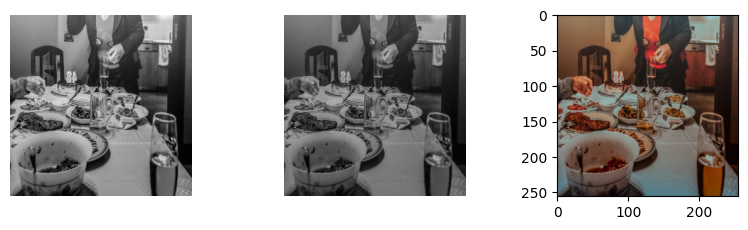

  2%|▏         | 10/500 [00:06<03:08,  2.60it/s]


Epoch 1/100
Iteraton10/500


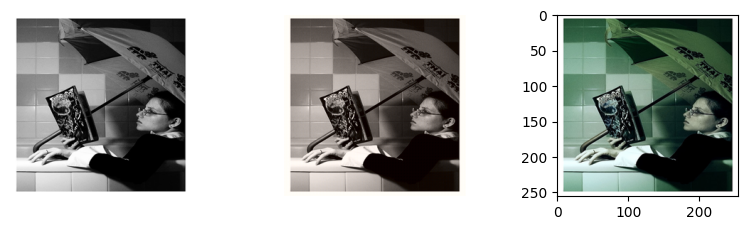

  4%|▍         | 20/500 [00:10<02:47,  2.87it/s]


Epoch 1/100
Iteraton20/500


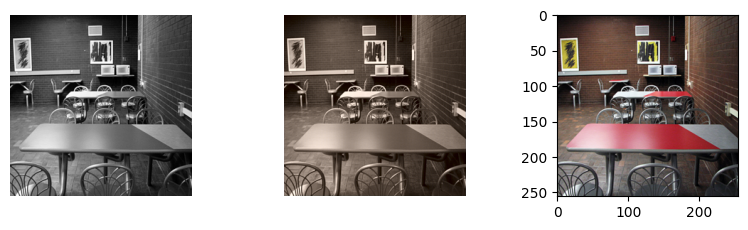

  6%|▌         | 30/500 [00:16<03:54,  2.00it/s]


Epoch 1/100
Iteraton30/500


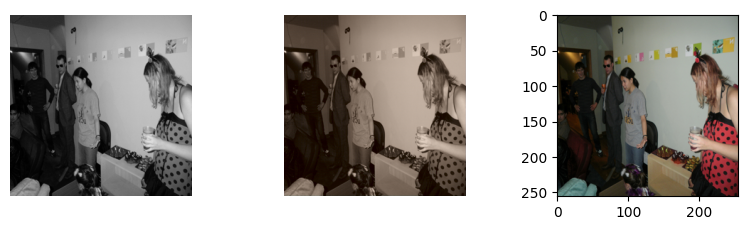

  8%|▊         | 40/500 [00:20<02:44,  2.79it/s]


Epoch 1/100
Iteraton40/500


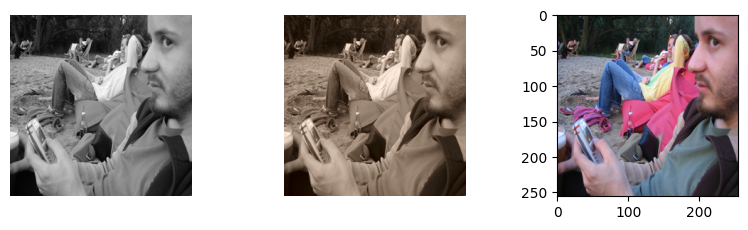

 10%|█         | 50/500 [00:25<02:39,  2.82it/s]


Epoch 1/100
Iteraton50/500


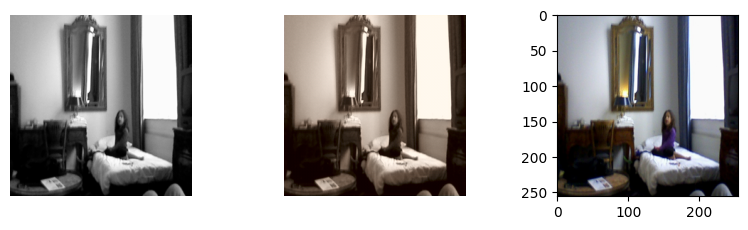

 12%|█▏        | 60/500 [00:32<03:20,  2.19it/s]


Epoch 1/100
Iteraton60/500


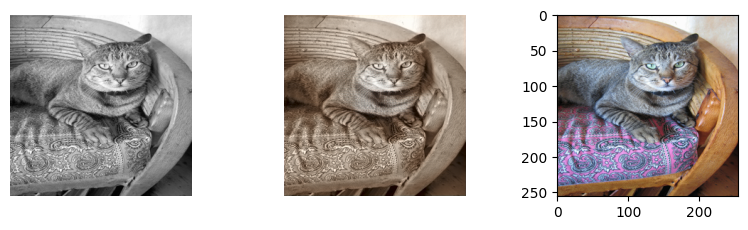

 14%|█▍        | 70/500 [00:36<02:33,  2.80it/s]


Epoch 1/100
Iteraton70/500


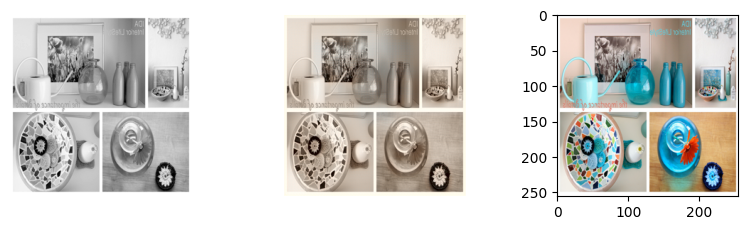

 16%|█▌        | 80/500 [00:41<02:32,  2.75it/s]


Epoch 1/100
Iteraton80/500


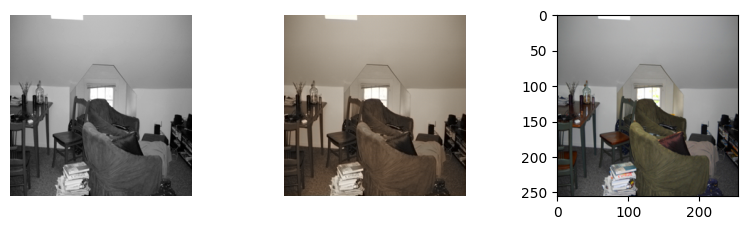

 18%|█▊        | 90/500 [00:47<02:34,  2.65it/s]


Epoch 1/100
Iteraton90/500


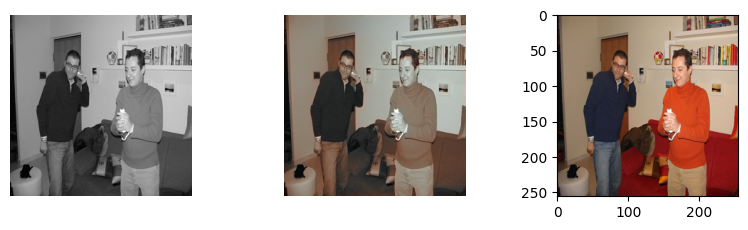

 20%|██        | 100/500 [00:52<03:14,  2.06it/s]


Epoch 1/100
Iteraton100/500


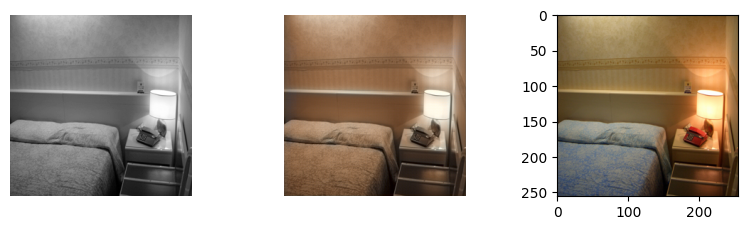

 22%|██▏       | 110/500 [00:57<03:16,  1.98it/s]


Epoch 1/100
Iteraton110/500


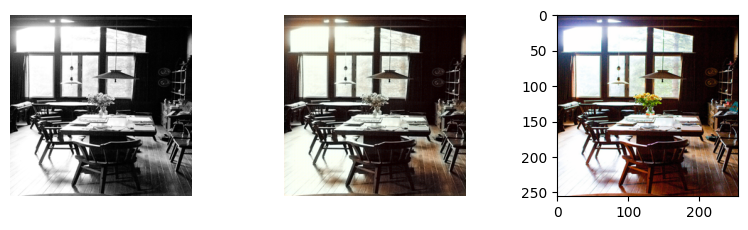

 24%|██▍       | 120/500 [01:02<02:19,  2.72it/s]


Epoch 1/100
Iteraton120/500


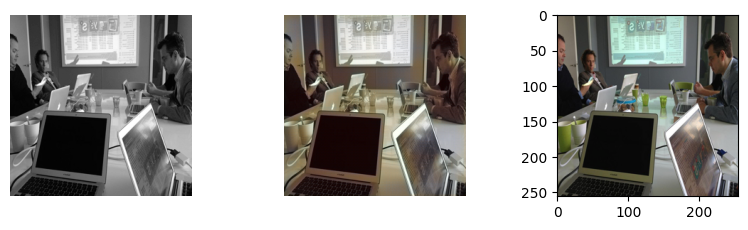

 26%|██▌       | 130/500 [01:06<02:12,  2.80it/s]


Epoch 1/100
Iteraton130/500


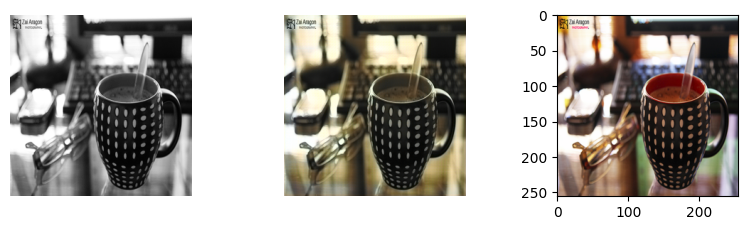

 28%|██▊       | 140/500 [01:12<02:15,  2.65it/s]


Epoch 1/100
Iteraton140/500


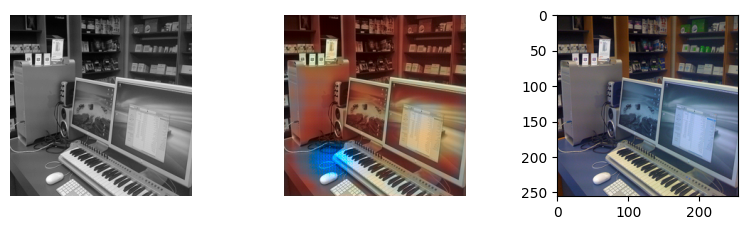

 30%|███       | 150/500 [01:17<02:08,  2.73it/s]


Epoch 1/100
Iteraton150/500


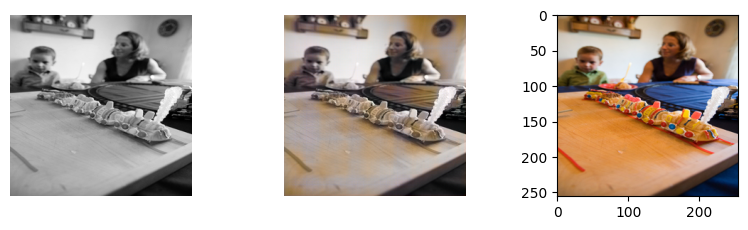

 32%|███▏      | 160/500 [01:22<02:42,  2.09it/s]


Epoch 1/100
Iteraton160/500


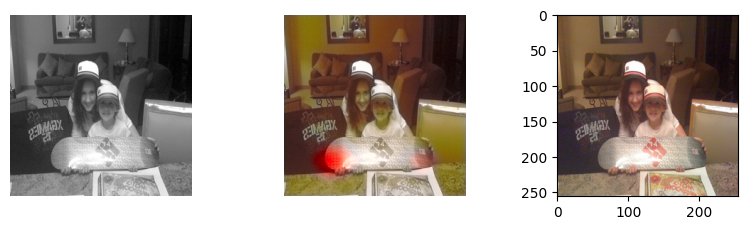

 34%|███▍      | 170/500 [01:27<02:06,  2.61it/s]


Epoch 1/100
Iteraton170/500


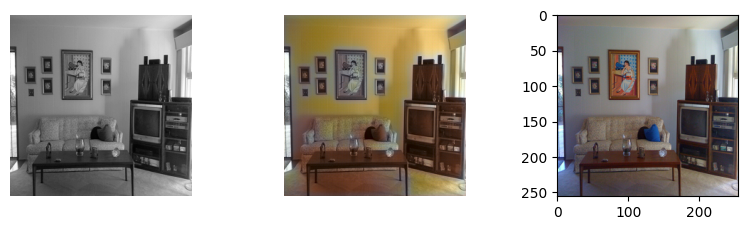

 36%|███▌      | 180/500 [01:32<01:56,  2.75it/s]


Epoch 1/100
Iteraton180/500


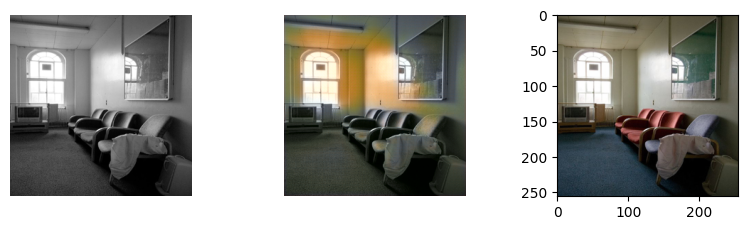

 38%|███▊      | 190/500 [01:37<02:47,  1.85it/s]


Epoch 1/100
Iteraton190/500


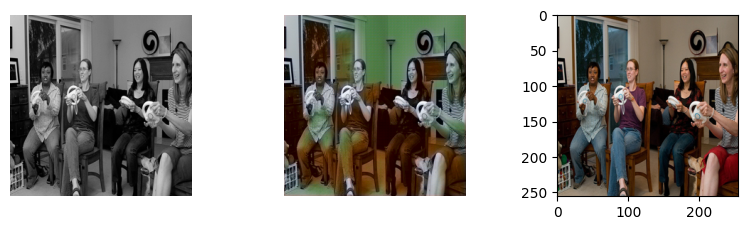

 40%|████      | 200/500 [01:42<01:51,  2.68it/s]


Epoch 1/100
Iteraton200/500


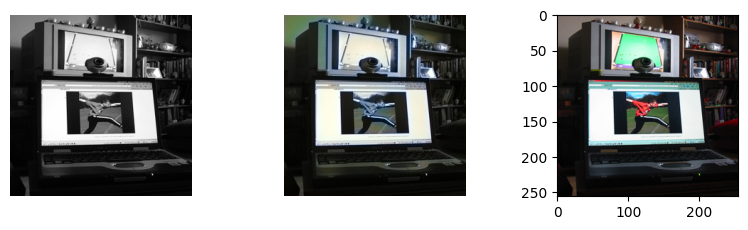

 42%|████▏     | 210/500 [01:47<01:45,  2.74it/s]


Epoch 1/100
Iteraton210/500


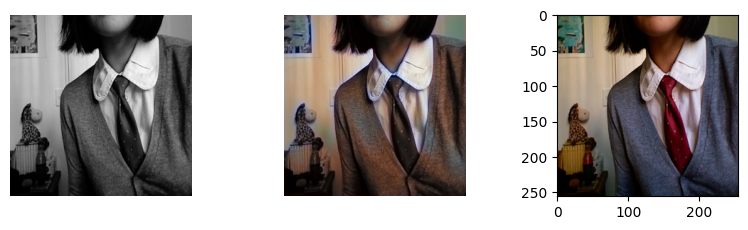

 44%|████▍     | 220/500 [01:53<01:48,  2.59it/s]


Epoch 1/100
Iteraton220/500


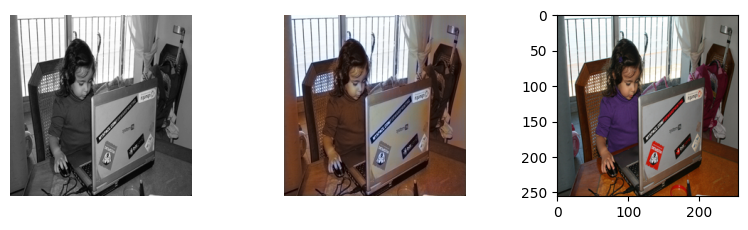

 46%|████▌     | 230/500 [01:57<01:38,  2.74it/s]


Epoch 1/100
Iteraton230/500


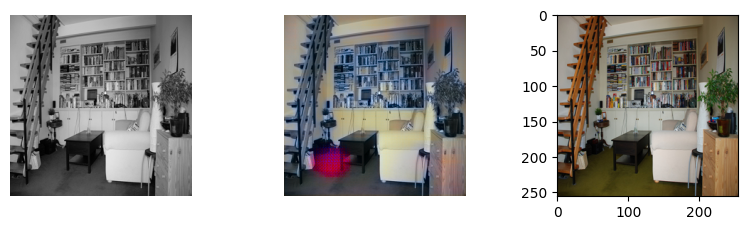

 48%|████▊     | 240/500 [02:03<02:12,  1.96it/s]


Epoch 1/100
Iteraton240/500


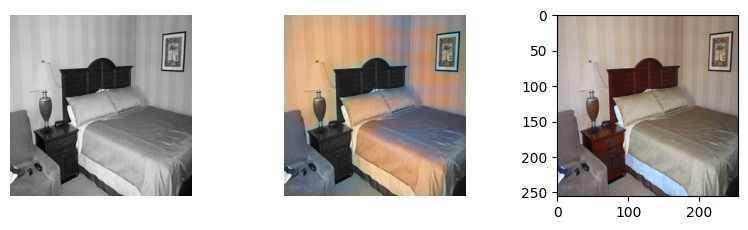

 50%|█████     | 250/500 [02:08<01:34,  2.64it/s]


Epoch 1/100
Iteraton250/500


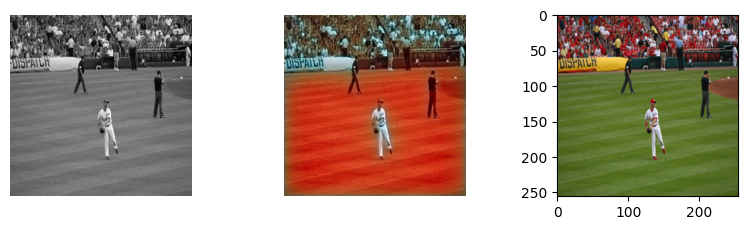

 52%|█████▏    | 260/500 [02:12<01:29,  2.68it/s]


Epoch 1/100
Iteraton260/500


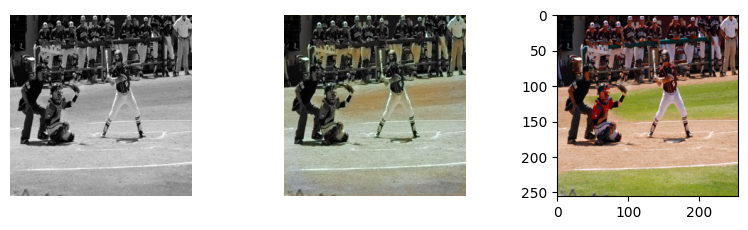

 54%|█████▍    | 270/500 [02:18<01:58,  1.95it/s]


Epoch 1/100
Iteraton270/500


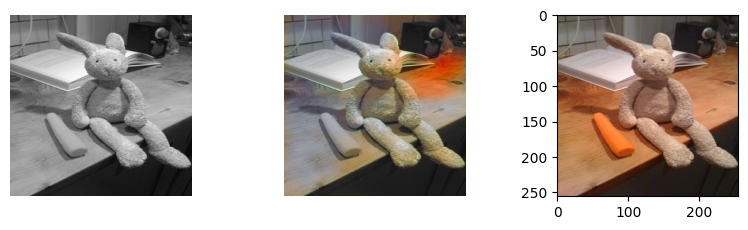

 56%|█████▌    | 280/500 [02:23<01:26,  2.54it/s]


Epoch 1/100
Iteraton280/500


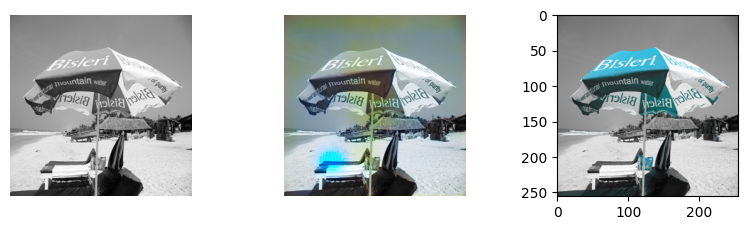

 58%|█████▊    | 290/500 [02:27<01:18,  2.69it/s]


Epoch 1/100
Iteraton290/500


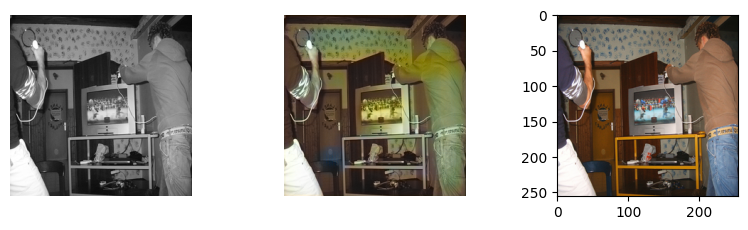

 60%|██████    | 300/500 [02:34<01:22,  2.43it/s]


Epoch 1/100
Iteraton300/500


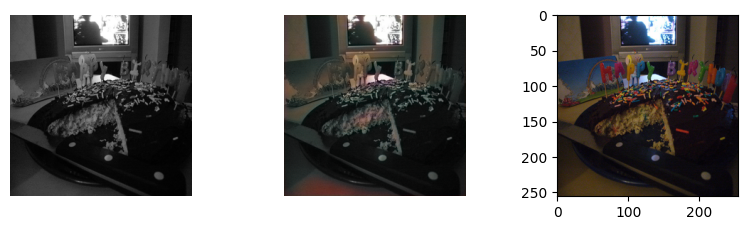

 62%|██████▏   | 310/500 [02:38<01:16,  2.49it/s]


Epoch 1/100
Iteraton310/500


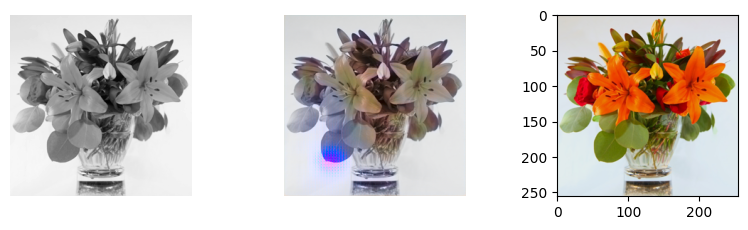

 64%|██████▍   | 320/500 [02:44<01:39,  1.80it/s]


Epoch 1/100
Iteraton320/500


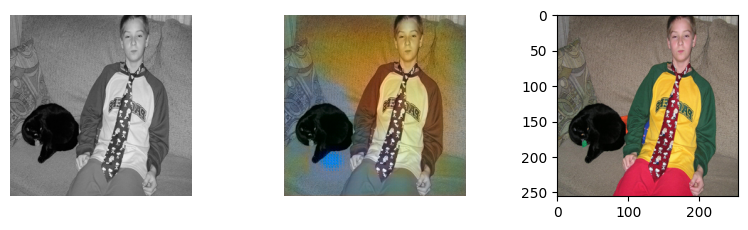

 66%|██████▌   | 330/500 [02:49<01:06,  2.54it/s]


Epoch 1/100
Iteraton330/500


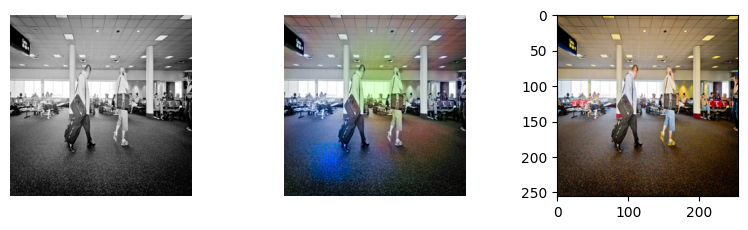

 68%|██████▊   | 340/500 [02:54<01:03,  2.51it/s]


Epoch 1/100
Iteraton340/500


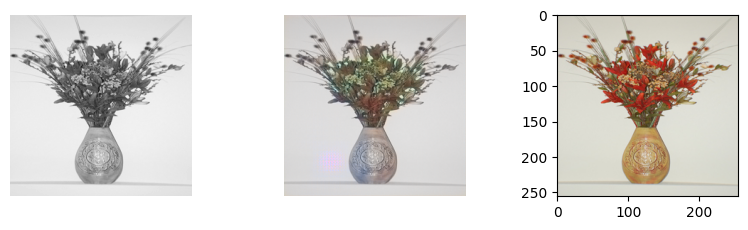

 70%|███████   | 350/500 [03:00<01:05,  2.30it/s]


Epoch 1/100
Iteraton350/500


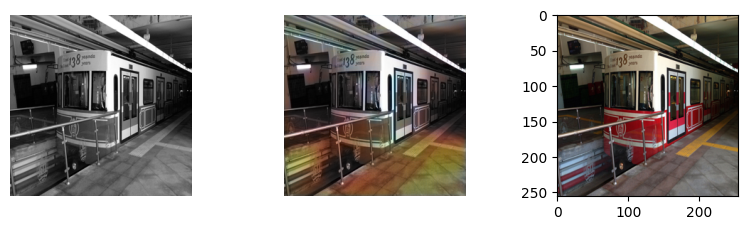

 72%|███████▏  | 360/500 [03:05<00:55,  2.54it/s]


Epoch 1/100
Iteraton360/500


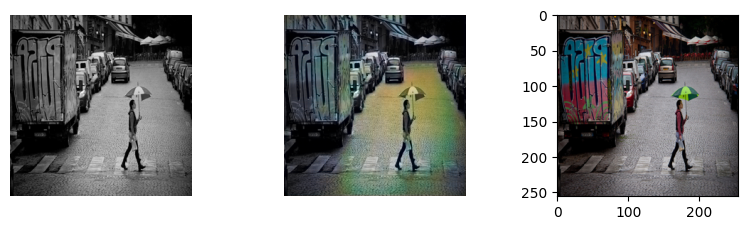

 74%|███████▍  | 370/500 [03:10<01:05,  1.98it/s]


Epoch 1/100
Iteraton370/500


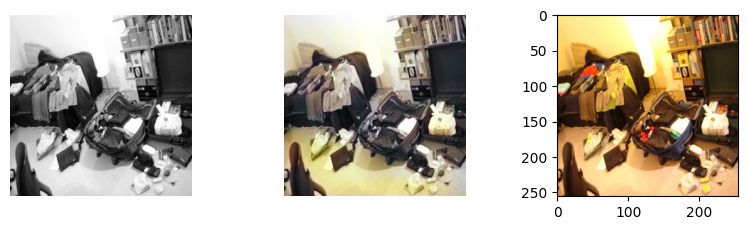

 76%|███████▌  | 380/500 [03:15<00:48,  2.49it/s]


Epoch 1/100
Iteraton380/500


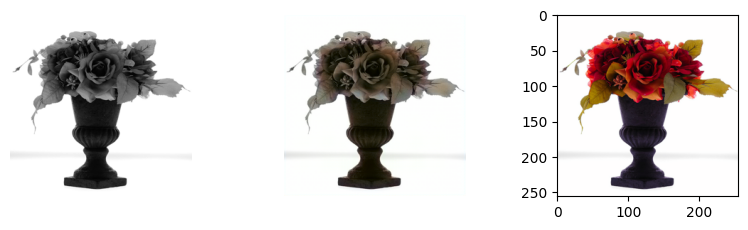

 78%|███████▊  | 390/500 [03:20<00:41,  2.68it/s]


Epoch 1/100
Iteraton390/500


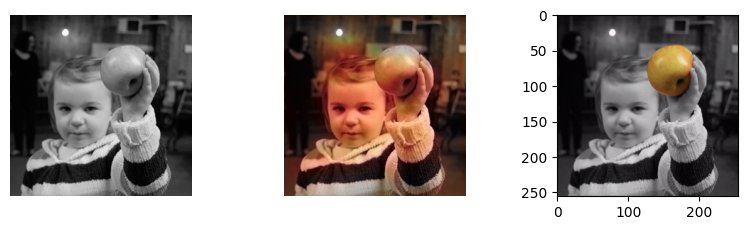

 80%|████████  | 400/500 [03:26<00:52,  1.91it/s]


Epoch 1/100
Iteraton400/500


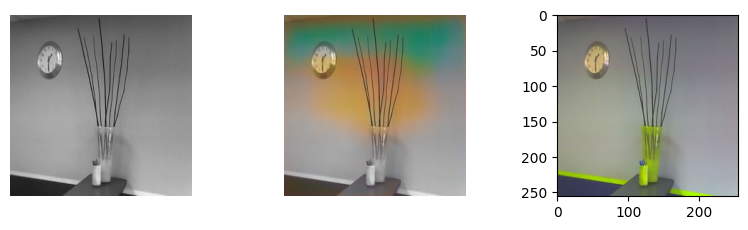

 82%|████████▏ | 410/500 [03:31<00:34,  2.62it/s]


Epoch 1/100
Iteraton410/500


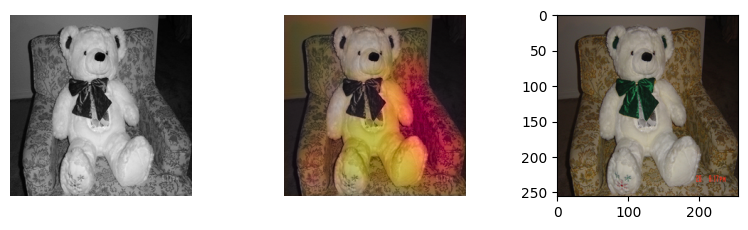

 84%|████████▍ | 420/500 [03:36<00:31,  2.54it/s]


Epoch 1/100
Iteraton420/500


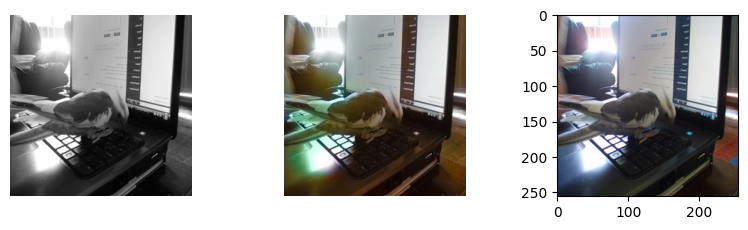

 86%|████████▌ | 430/500 [03:41<00:28,  2.45it/s]


Epoch 1/100
Iteraton430/500


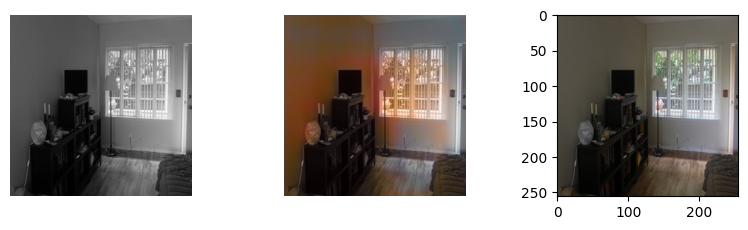

 88%|████████▊ | 440/500 [03:46<00:22,  2.63it/s]


Epoch 1/100
Iteraton440/500


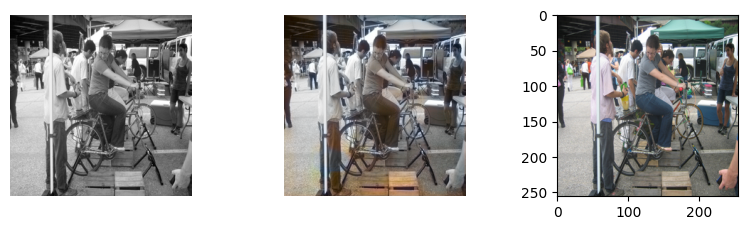

 90%|█████████ | 450/500 [03:52<00:29,  1.72it/s]


Epoch 1/100
Iteraton450/500


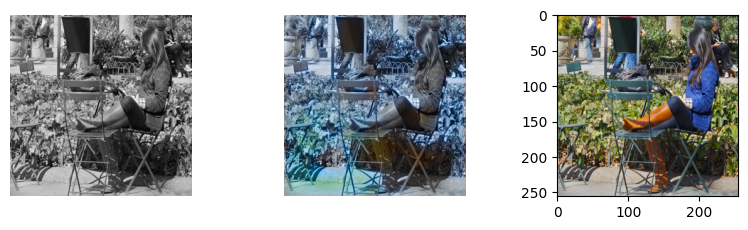

 92%|█████████▏| 460/500 [03:58<00:16,  2.38it/s]


Epoch 1/100
Iteraton460/500


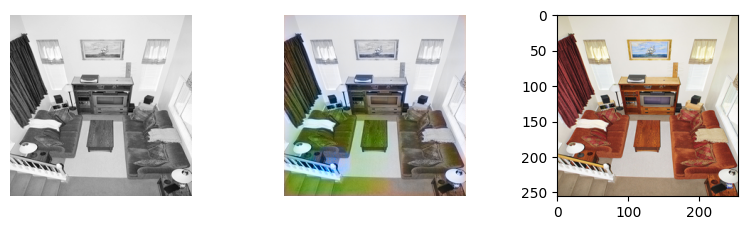

 94%|█████████▍| 470/500 [04:02<00:11,  2.65it/s]


Epoch 1/100
Iteraton470/500


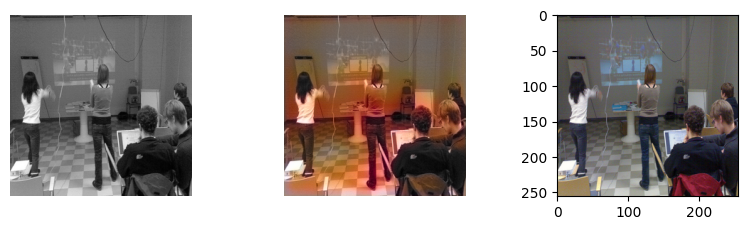

 96%|█████████▌| 480/500 [04:08<00:09,  2.16it/s]


Epoch 1/100
Iteraton480/500


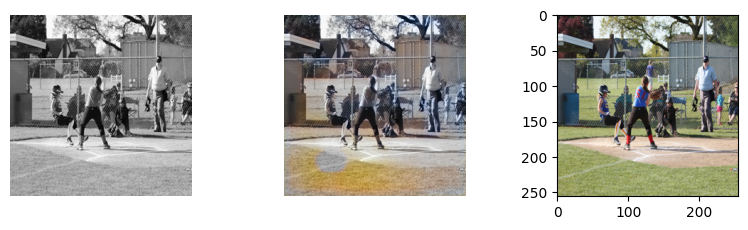

 98%|█████████▊| 490/500 [04:13<00:04,  2.42it/s]


Epoch 1/100
Iteraton490/500


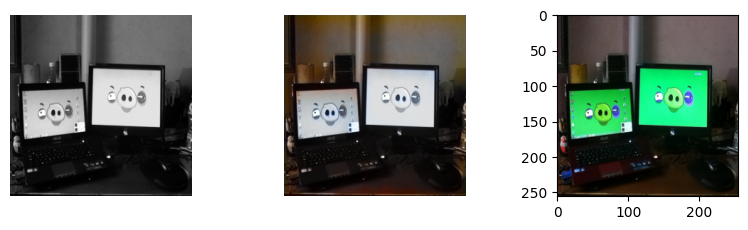

  0%|          | 0/500 [00:00<?, ?it/s]


Epoch 2/100
Iteraton0/500


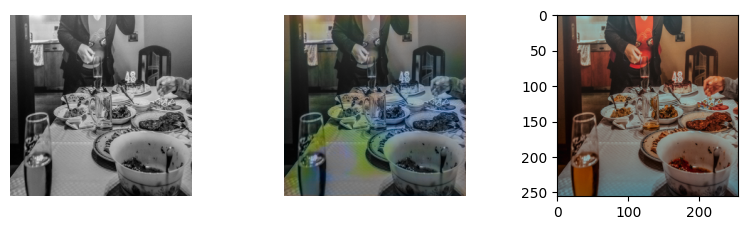

  2%|▏         | 10/500 [00:06<04:37,  1.77it/s]


Epoch 2/100
Iteraton10/500


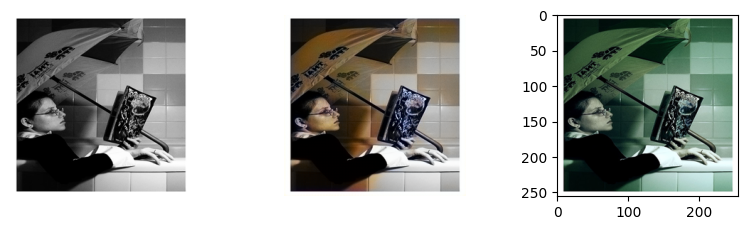

  4%|▍         | 20/500 [00:12<03:21,  2.38it/s]


Epoch 2/100
Iteraton20/500


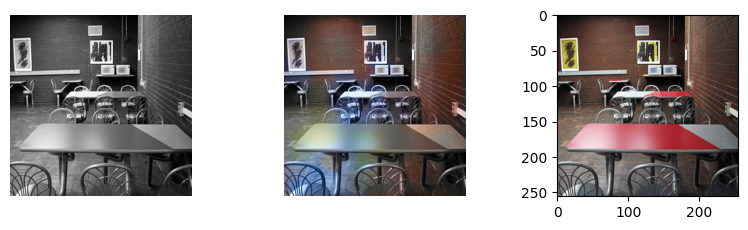

  6%|▌         | 30/500 [00:18<03:17,  2.38it/s]


Epoch 2/100
Iteraton30/500


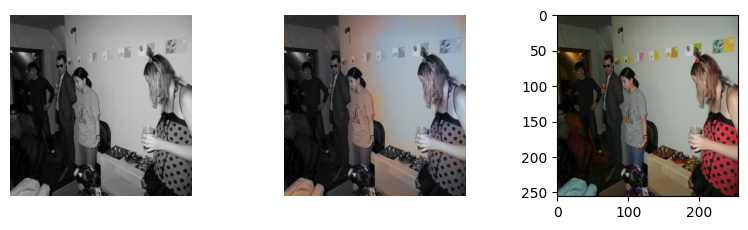

  8%|▊         | 40/500 [00:23<02:56,  2.61it/s]


Epoch 2/100
Iteraton40/500


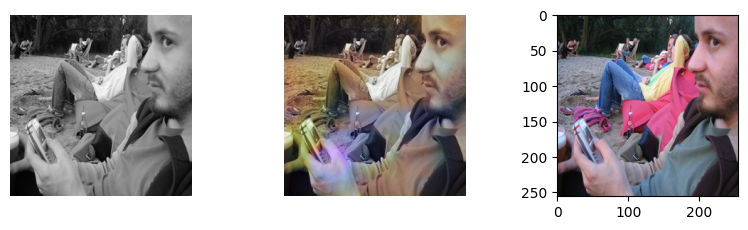

 10%|█         | 50/500 [00:29<04:10,  1.80it/s]


Epoch 2/100
Iteraton50/500


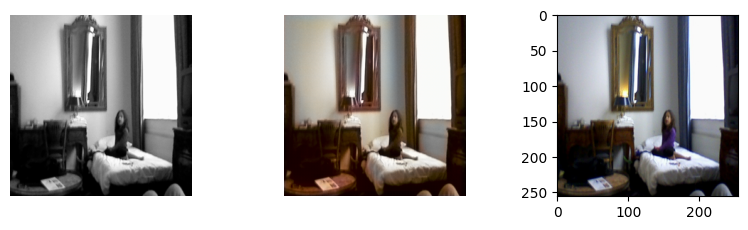

 12%|█▏        | 60/500 [00:34<03:18,  2.22it/s]


Epoch 2/100
Iteraton60/500


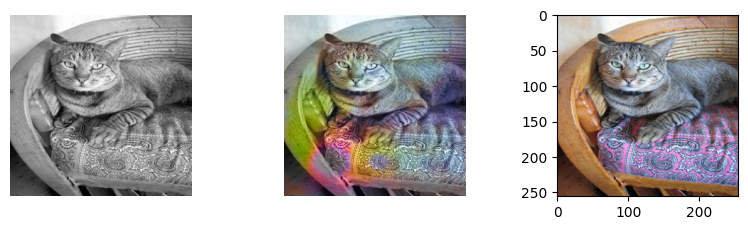

 14%|█▍        | 70/500 [00:39<02:47,  2.57it/s]


Epoch 2/100
Iteraton70/500


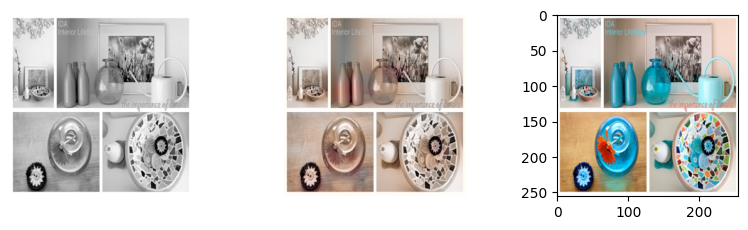

 16%|█▌        | 80/500 [00:45<03:10,  2.20it/s]


Epoch 2/100
Iteraton80/500


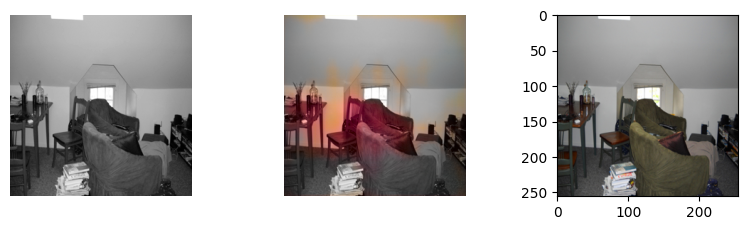

 18%|█▊        | 90/500 [00:50<02:52,  2.37it/s]


Epoch 2/100
Iteraton90/500


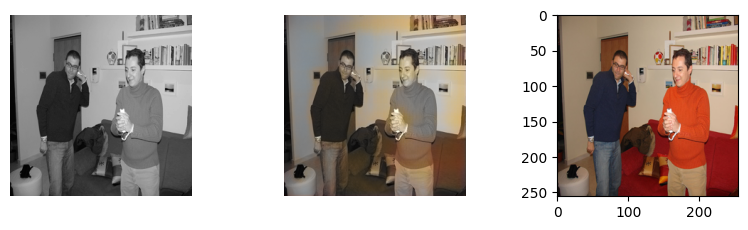

 20%|██        | 100/500 [00:56<03:53,  1.71it/s]


Epoch 2/100
Iteraton100/500


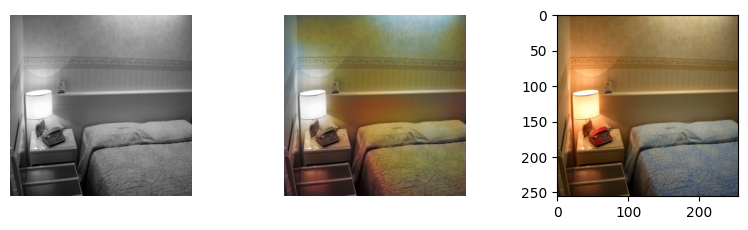

 22%|██▏       | 110/500 [01:01<02:32,  2.57it/s]


Epoch 2/100
Iteraton110/500


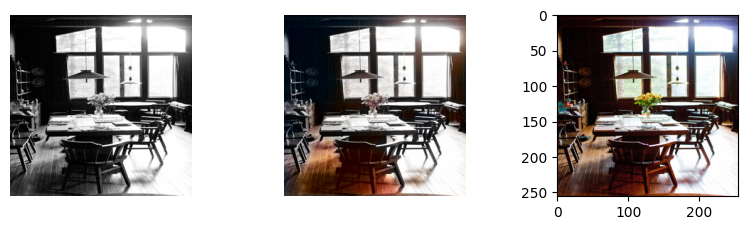

 24%|██▍       | 120/500 [01:06<02:37,  2.41it/s]


Epoch 2/100
Iteraton120/500


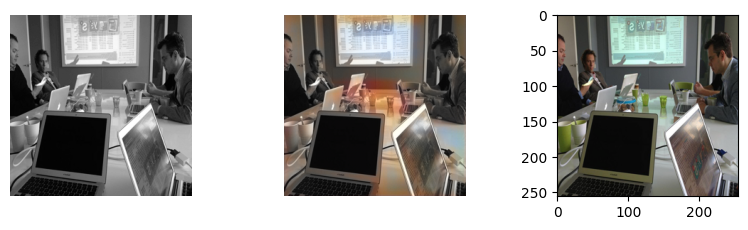

 26%|██▌       | 130/500 [01:12<02:56,  2.10it/s]


Epoch 2/100
Iteraton130/500


 26%|██▌       | 130/500 [01:13<03:30,  1.76it/s]


KeyboardInterrupt: ignored

In [105]:
import warnings
from tqdm import tqdm
#generator 초기화
model_generator= initialize_model(pix2pix_Generator())
#generator를 gpu로 보내기
model_generator.to(device)
#discriminator 초기화
model_discriminator=initialize_model(pix2pix_Discriminator())
#discriminator gpu로 보내기
model_discriminator.to(device)
#로스 함수 선언
criterion=GANLoss().to(device)
#L1로스 함수 선언
L1=nn.L1Loss()

#옵티마이저 선언
optimizer_generator=optim.Adam(model_generator.parameters(),lr=2e-4,betas=(0.5,0.999))
optimizer_discriminator=optim.Adam(model_discriminator.parameters(),lr=2e-4,betas=(0.5,0.999))
#epoch
epochs=100
for e in range(epochs):
  #dataloader 로부터 데이터를 뽑아서 학습을 합시다!!
  for index, data in enumerate(tqdm(dataloader_train)):
    #discriminator는 잠깐 멈추고 generator를 학습상태임
    #L데이터를 gpu에 보내주기
    L=data['L'].to(device)
    #ab데이터를 gpu에 보내주
    ab=data['ab'].to(device)
    #생성자에 L채널을 넣고, fake color를 얻어내자!
    fake_color=model_generator(L)
    #훈련시작
    model_discriminator.train()

    #discriminaotr freeze를 잠깐 풀어주기
    for parameter in model_discriminator.parameters():
        parameter.requires_grad=True

    #zero_grad -> pytorch에서는 interation이 끝나면 gradient를 항상 0으로 만들어 주어야함.
    #왜냐하면 이전 iteration의 기울기 값이 영향을 미칠수가 있기때문임.
    optimizer_discriminator.zero_grad()
    #fake image
    fake_image=torch.cat([L,fake_color],dim=1)
    #.copy()를 하게 된다면 기울기까지 다같이 복사 해버림.
    #.detach()를 통해서 그냥 값만 복사, generator에 영향을 주지 않음.

    #가짜 이미지를 만들었으니, 이제 discriminator에 넣어서 pred를 봐야함.
    fake_preds=model_discriminator(fake_image.detach())
    #로스 함수 계산합시다!
    loss_discriminator_fake=criterion(fake_preds,False)

    #진짜 이미지 만들기!
    real_image=torch.cat([L,ab],dim=1)
    real_preds=model_discriminator(real_image)
    #로스함수 계산합시다.
    loss_discriminator_real=criterion(real_preds,True)
    #로스를 더합시다
    loss_discriminator_total=loss_discriminator_fake+loss_discriminator_real*0.5
    #discriminator를 역전파
    loss_discriminator_total.backward()
    #optimizer 합시다.
    optimizer_discriminator.step()

    #generator훈련시작
    model_generator.train()
    #generator를 학습하기 위해 잠깐 discriminator를 freeze함
    for parameter in model_discriminator.parameters():
      parameter.requires_grad=False
    #zero_grad -> pytorch에서는 interation이 끝나면 gradient를 항상 0으로 만들어 주어야함.
    #왜냐하면 이전 iteration의 기울기 값이 영향을 미칠수가 있기때문임.
    optimizer_generator.zero_grad()

    #가짜 이미지 만들어보기
    fake_image=torch.cat([L, fake_color],dim=1)
    #generator가 생성한 가짜 이미지를 앞서 훈련된 discrminator에 넣어주자!!!
    fake_preds=model_discriminator(fake_image)
    #로스 개선
    loss_generator_GAN=criterion(fake_preds,True)
    #L1 로스 개선
    loss_generator_L1=L1(fake_color,ab)*100.
    #loss더하기
    loss_generator_total=loss_generator_GAN+loss_generator_L1
    #generator를 backpropagationo시키기
    loss_generator_total.backward()
    #optimizer 실행시키기.파라미터를 업데이트
    optimizer_generator.step()

    #200번째 인덱스마다
    if index %10 ==0:
      #에포크를 프린트
      print(f"\nEpoch {e+1}/{epochs}")
      print(f"Iteraton{index}/{len(dataloader_train)}")
      #자잘한 오류 메세지 제거
      with warnings.catch_warnings():
        #모든 경고 메세지를 무시하게 시킵니다.
        warnings.simplefilter("ignore")
        #generator가 훈련되면 안되니 eval mode로 변환
        model_generator.eval()
        #기울기 업데이트를 막기.
        with torch.no_grad():
          L=data['L'].to(device)
          ab=data['ab'].to(device)
          #가짜 색 만들기
          fake_color=model_generator(L)
        #generator를 다시 훈련모드로 변환.
        model_generator.train()
        #가짜 색 복사
        fake_color=fake_color.detach()
        #진짜 색
        real_color=ab
        fake_imgs=lab_to_rgb(L,fake_color)
        real_imgs=lab_to_rgb(L, real_color)

        fig=plt.figure(figsize=(10,8))
        ax=plt.subplot(3,3,1)
        ax.imshow(L[1][0].cpu(),cmap='gray')
        ax.axis("off")
        ax=plt.subplot(3,3,2)
        ax.imshow(fake_imgs[1])
        ax.axis("off")
        ax=plt.subplot(3,3,3)
        ax.imshow(real_imgs[1])
        plt.show()